![Perth_House.png](https://datasciencecc.s3.us-east-2.amazonaws.com/Perth_House.png)

**Es importante resaltar que este laboratorio es con fines personales y que sus resultados no tiene que reflejarse completamente a la realidad**

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;"> 1. Introducción:</p>

Debido al aumento de las ventas de viviendas ubicadas en el Suroeste de Australia especificamente en la ciudad de Perth y al desconocimiento de la valorización de muchas propiedades segun sus caracteristicas especificas como se puede observar en la [base de datos](https://www.kaggle.com/datasets/syuzai/perth-house-prices/data), se vio la necesidad de evaluar diferentes modelos predictivos para el precio de las viviendas ubicadas en dicha localidad. Además, de realizar un analisis de las variables más importantes para la creación del modelo.

Las variables que contiene nuestra base de datos estan resumidas en la siguiente tabla:

- ADDRESS : Dirección fisica del inmueble
- SUBURB : Lugar especifico ubicado en Perth
- PRICE : Precio por el que cada propiedad fue vendida [AUD]
- BEDROOMS : Numero de dormitorios
- BATHROOMS : Numero de baños
- GARAGE : Numero de garajes 
- LAND_AREA : Area total del terreno [$m^2$]
- FLOOR_AREA : Area construida [$m^2$]
- BUILD_YEAR : Año en el que la propiedad fue construida
- CBD_DIST : Distancia desde el centro de Perth [m]
- NEAREST_STN : La estación de transporte publico mas cerca a la propiedad
- NEAREST_STN_DIST : La distancia  a la estación de transporte mas cerca a la propiedad [m]
- DATE_SOLD : Año y mes en que la propiedad fue vendida
- POSTCODE : Codigo postal del area
- LATITUDE : Ubicación geografica de la propiedad (Latitud)
- LONGITIDE : Ubicación geografica de la propiedad (Longitud)
- NEAREST_SCH : El colegio más cerca a la propiedad
- NEAREST_SCH_DIST : La distancia al colegio más cerca a la propiedad
- NEAREST_SCH_RANK : Ranking del colegio más cercano a la propiedad

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;"> 2. Importación de datos y analisis preliminar:</p>

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import gaussian_kde

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


import warnings
warnings.filterwarnings(action='ignore')

In [3]:
data = pd.read_csv('all_perth_310121.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33656 entries, 0 to 33655
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ADDRESS           33656 non-null  object 
 1   SUBURB            33656 non-null  object 
 2   PRICE             33656 non-null  int64  
 3   BEDROOMS          33656 non-null  int64  
 4   BATHROOMS         33656 non-null  int64  
 5   GARAGE            31178 non-null  float64
 6   LAND_AREA         33656 non-null  int64  
 7   FLOOR_AREA        33656 non-null  int64  
 8   BUILD_YEAR        30501 non-null  float64
 9   CBD_DIST          33656 non-null  int64  
 10  NEAREST_STN       33656 non-null  object 
 11  NEAREST_STN_DIST  33656 non-null  int64  
 12  DATE_SOLD         33656 non-null  object 
 13  POSTCODE          33656 non-null  int64  
 14  LATITUDE          33656 non-null  float64
 15  LONGITUDE         33656 non-null  float64
 16  NEAREST_SCH       33656 non-null  object

In [4]:
data.head(5)

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


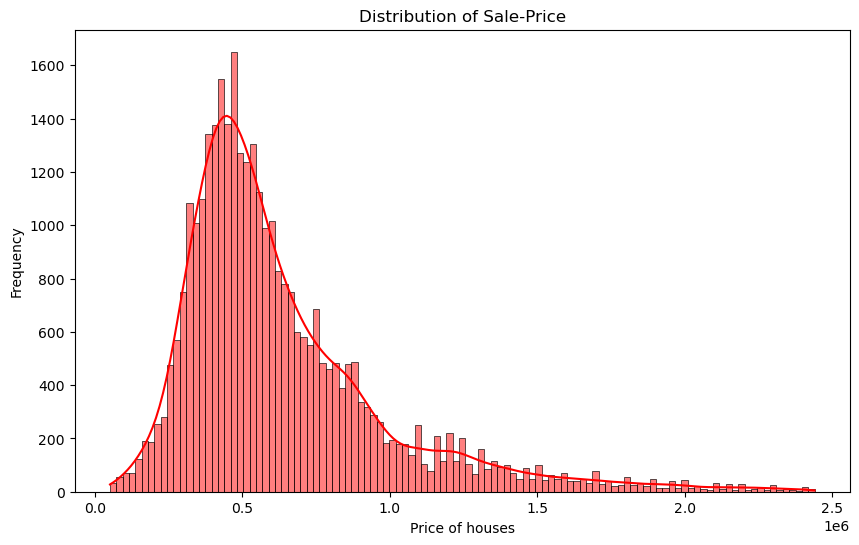

count    3.365600e+04
mean     6.370720e+05
std      3.558256e+05
min      5.100000e+04
25%      4.100000e+05
50%      5.355000e+05
75%      7.600000e+05
max      2.440000e+06
Name: PRICE, dtype: float64

In [5]:
price = data['PRICE']
plt.figure(figsize=(10, 6))
sns.histplot(price, kde=True, color='r')
plt.title('Distribution of Sale-Price')
plt.xlabel('Price of houses')
plt.ylabel('Frequency')
plt.show()
price.describe()

El histograma presenta una distribución sesgada hacia la izquierda, con una mayor concentración de valores en las casas menos costosas. La media del precio de todas las casas de Perth es de 637072.00 Dolares Australianos, mientras que la mediana es de 535500.00. Esto indica que la mayoría de las casas en la muestra cuestan menos de 637072.00 Dolares Australianos.

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">3. Preprosesamiento y limpieza de datos:</p>

In [6]:
import plotly.express as px
import pandas as pd


color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(data, 
                        lat="LATITUDE", 
                        lon="LONGITUDE", 
                        hover_name="ADDRESS", 
                        hover_data=["ADDRESS", "PRICE"],
                        color="PRICE",
                        color_continuous_scale="OrRd",
                        size="PRICE",
                        size_max=5,
                        zoom=10, 
                        height=800,
                        width=950)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Se puede observar que las propiedades cerca a las playas/costas y a las orillas del rio Swan tienden a tener un valor que esta por encima del promedio.

Se determinara aquellas variables que son relevantes para nuestro modelo de Machine learning teniendo en cuenta la cantidad de datos que hay en los atributos de nuestra muestra. Luego se dividira las variables que son de tipo "*Object, Float y Int*" para evaluar si son escenciales para el modelo

In [7]:
X = data

In [8]:
{column: len(X[column].unique()) for column in X.select_dtypes('object').columns}

{'ADDRESS': 33566,
 'SUBURB': 321,
 'NEAREST_STN': 68,
 'DATE_SOLD': 350,
 'NEAREST_SCH': 160}

In [9]:
{column: len(X[column].unique()) for column in X.select_dtypes('int').columns}

{'PRICE': 2297,
 'BEDROOMS': 10,
 'BATHROOMS': 8,
 'LAND_AREA': 4372,
 'FLOOR_AREA': 528,
 'CBD_DIST': 595,
 'NEAREST_STN_DIST': 1189,
 'POSTCODE': 114}

Los atributos"**ADDRESS**" y "**POSTCODE**" no son significativas en nuestro modelo de ML ya que solo nos da la información de la identificación y ubicación de manera precisa en terminos sociales.

In [10]:
X = X.drop(["ADDRESS","POSTCODE"],axis=1)
X.head(5)

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


Para identificar los valores nulos y el porcentaje de estos sobre el total de los datos se realiza el siguiente grafico

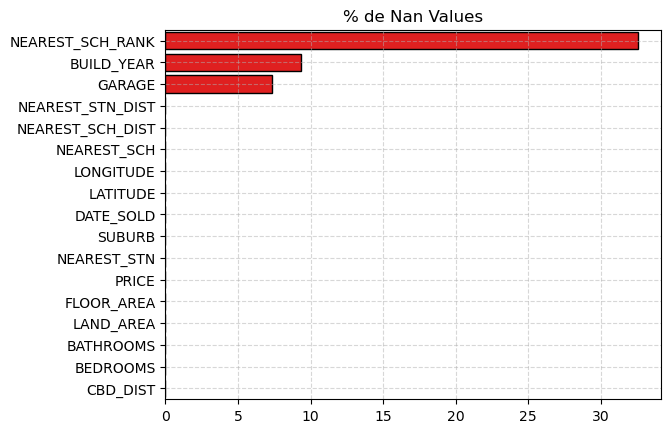

In [11]:
fig, ax = plt.subplots()
nan = (X.isnull().sum()/len(X)*100).sort_values(ascending = False)
sns.barplot(x=nan,y=nan.index, edgecolor='k',color='red')
plt.title("% de Nan Values")
ax.grid(ls='--',alpha = 0.5)
plt.show()

En la teoría, cuando se cuenta con atributos que tienen menos del 70% de los datos completos, se puede tomar la decisión de eliminar cicha variable, como lo es en esta ocasión para "**NEAREST_SCH_RANK**". Para aquellas que tienen datos nulos pero que no superan el 30% de los datos se pueden rellenar con las siguientes opciones:

- [x] La medía de todos los valores de la variable
- [x] La moda de todos los valores de la variable
- [ ] La mediana de todos los valores de la variable
- [ ] El promedio entre el valor superior e inferior
- [ ] Igual valor al superior o el inferior

Para esta ocasión, rellenamos los datos faltantes en las variables ***"BUILD_YEAR" y "GARAGE"*** con la opción seleccionada anteriormentepara respectivamente

Para tener más inf de las variables podemos ver los metadatos. En caso de no encontrar inf relevante, se puede visualizar los datos de cada variable

    df = df.drop('NEAREST_SCH_RANK',axis=1)

In [12]:
X = X.drop('NEAREST_SCH_RANK',axis=1)

Debido a la inf que esta disponible, se estima que la variable "**GARAGE**" indica la cantidad de vehiculos que pueden estar dentro del garaje, asi que,  los datos null seran sustituidos por la mediana de la variable.
Los datos nulos de la variable "**BUILD_YEAR**" sera sustituida por la mediana del año de construccion de todas las casas en venta

In [13]:
X['GARAGE'] = X['GARAGE'].fillna(X['GARAGE'].median())  
X['BUILD_YEAR'] = X['BUILD_YEAR'].fillna(X['BUILD_YEAR'].median())

In [14]:
X.isna().mean()

SUBURB              0.0
PRICE               0.0
BEDROOMS            0.0
BATHROOMS           0.0
GARAGE              0.0
LAND_AREA           0.0
FLOOR_AREA          0.0
BUILD_YEAR          0.0
CBD_DIST            0.0
NEAREST_STN         0.0
NEAREST_STN_DIST    0.0
DATE_SOLD           0.0
LATITUDE            0.0
LONGITUDE           0.0
NEAREST_SCH         0.0
NEAREST_SCH_DIST    0.0
dtype: float64

Para extraer la fecha que se vendio la casa convertimos el dato "DATE_SOLD" con datetime

In [15]:
X['DATE_SOLD'] = pd.to_datetime(X['DATE_SOLD'])
X['DATE_YEAR'] = X['DATE_SOLD'].apply(lambda x: x.year)
X['DATE_MONTH'] = X['DATE_SOLD'].apply(lambda x: x.month)
X = X.drop('DATE_SOLD',axis=1)

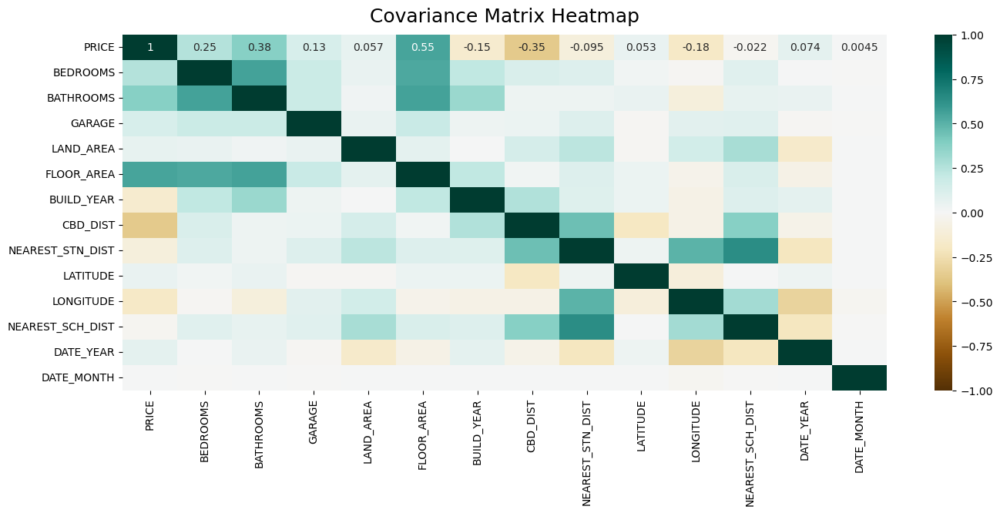

In [16]:
data_num = X.drop(X.select_dtypes(include=['object']).columns,axis=1)
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(data_num.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Covariance Matrix Heatmap', fontdict={'fontsize':18}, pad=12);

A partir de la grafica de correlación anterior, se observa una fuerte correlación en el aumento del precio cuando el area construida es mayor. Ademas de la cantidad de baños, dormitorios y vehiculos que entran en el garaje son de vital importancia para aumentar el costo de la vivienda.

Utilizamos "***get_dummies***" para facilitar el manejo de las variables categóricas en el modelo de ML

In [17]:
X = pd.get_dummies(X, columns=['SUBURB', 'NEAREST_STN', 'NEAREST_SCH', 'GARAGE'], dtype=float)
#X = X.drop(['SUBURB', 'NEAREST_STN', 'NEAREST_SCH', 'GARAGE'],axis=1)

In [18]:
y = X['PRICE']
X = X.drop('PRICE',axis=1)

MODELO ML

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">4. Machine Learning:</p>

## <code style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">Training:</code>

In [19]:
X_train, X_test, y_train, y_test = train_test_split (X, y, train_size= 0.7, shuffle=True, random_state=1)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train), index = X_train.index, columns = X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)

## <code style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">Results:</code>

## Chapter 1. My First Subsection <a class="anchor"  id="subsection1"></a>

In [20]:
evaluation_results = [] 
def evaluate_model_regression(model, model_name, X_train, y_train, X_test, y_test):
    # Training the model
    model.fit(X_train, y_train)

    # Printing training score
    training_score = model.score(X_train, y_train)
    print(f'Training score : {training_score}')

    # Printing testing score
    testing_score = model.score(X_test, y_test)
    print(f'Testing score : {testing_score}')
    
    evaluation_results.append({
        "Model": model_name,
        "Training Score": training_score,
        "Testing Score": testing_score,
    })

    # Making predictions on the test set
    y_prediction = model.predict(X_test)
    
    # Calculating and printing evaluation metrics for regression
    print(f'R2 score : {metrics.r2_score(y_test, y_prediction)}')
    print(f'MAE : {metrics.mean_absolute_error(y_test, y_prediction)}')
    print(f'MSE : {metrics.mean_squared_error(y_test, y_prediction)}')
    print(f'RMSE : {np.sqrt(metrics.mean_squared_error(y_test, y_prediction))}')
    
    # Plotting the distribution of residuals
    plt.figure(figsize=(12, 6))
    sns.distplot(y_test - y_prediction, color='orange', hist_kws=dict(edgecolor="black", linewidth=1))
    plt.title('Residuals Distribution', fontsize=16, color='blue')
    plt.xlabel('Residuals', fontsize=12, color='green')
    plt.ylabel('Density', fontsize=12, color='purple')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # Scatter plot comparing true values with predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_prediction, color='blue', alpha=0.5)
    plt.title('Scatter Plot of True Values vs. Predicted Values', fontsize=16)
    plt.xlabel('True Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

Training score : 0.782755044127355
Testing score : -1.0769520856966857e+21
R2 score : -1.0769520856966857e+21
MAE : 186327251303617.8
MSE : 1.3945729808580702e+32
RMSE : 1.1809203956482716e+16


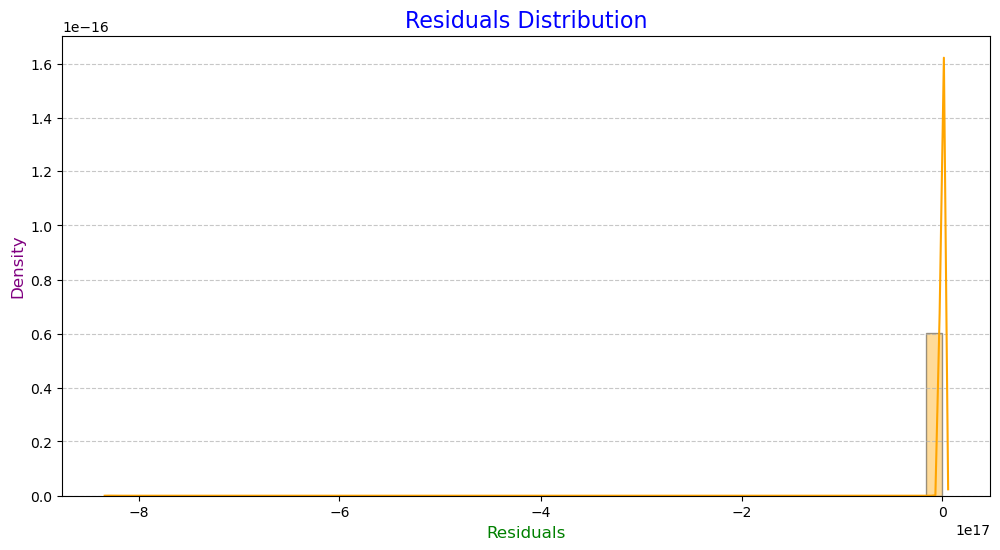

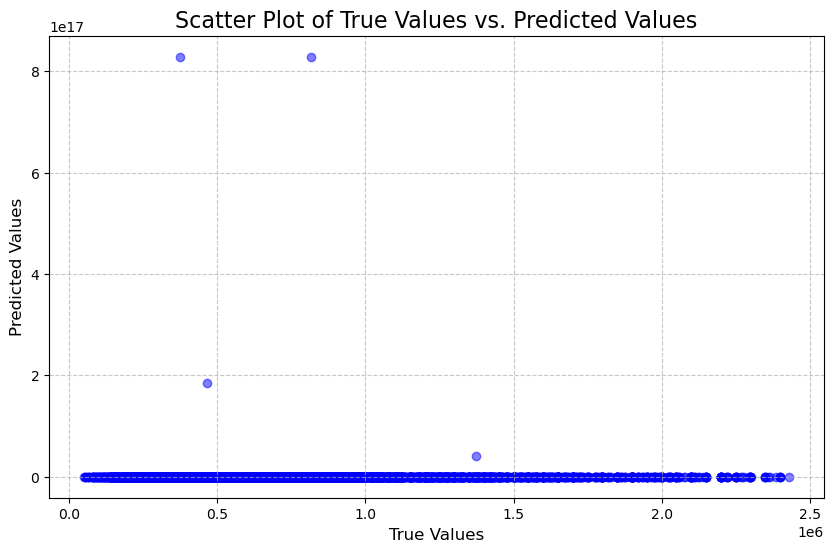

In [21]:
evaluate_model_regression(LinearRegression(), 'Linear Regression', X_train, y_train, X_test, y_test)

Training score : 0.7827894371872158
Testing score : 0.7773487350963223
R2 score : 0.7773487350963223
MAE : 109971.17916344406
MSE : 28831685486.515907
RMSE : 169798.956081938


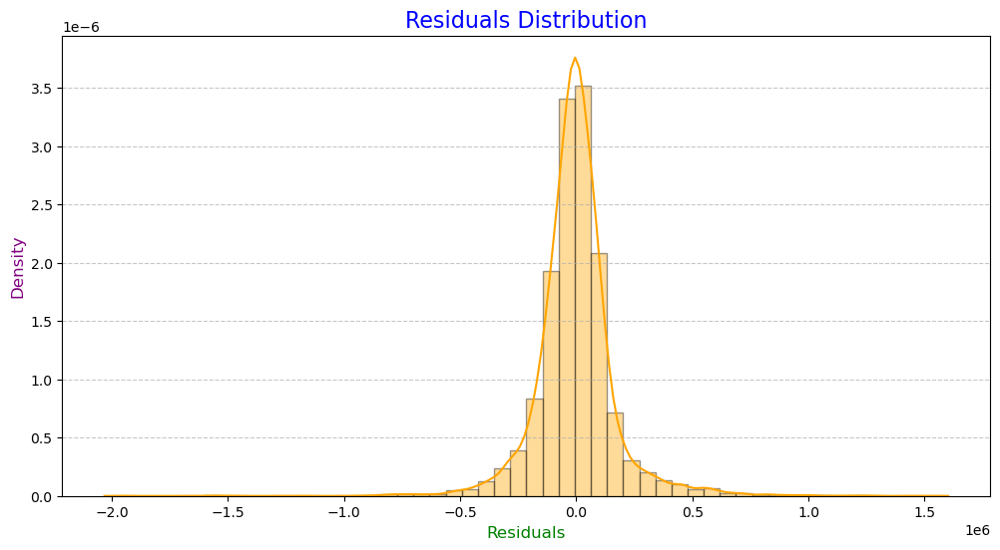

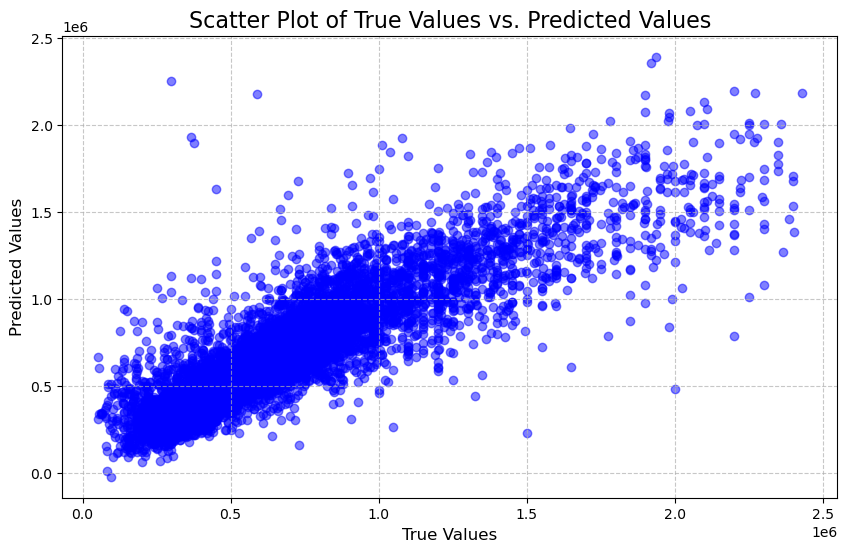

In [22]:
evaluate_model_regression(Ridge(), 'Ridge', X_train, y_train, X_test, y_test)

Training score : 0.7827866668493186
Testing score : 0.7773330829190521
R2 score : 0.7773330829190521
MAE : 109972.06047444072
MSE : 28833712327.24563
RMSE : 169804.9243315565


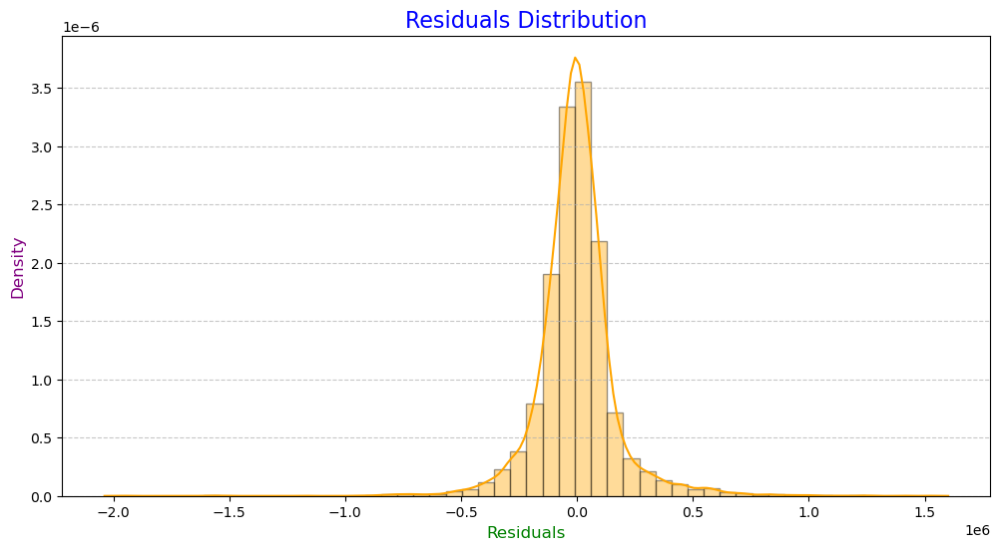

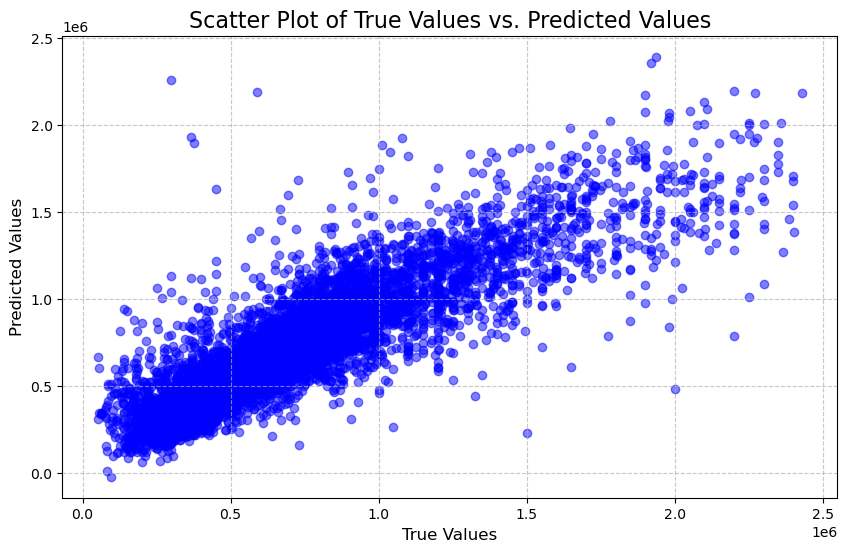

In [23]:
evaluate_model_regression(Lasso(), 'Lasso', X_train, y_train, X_test, y_test)

Training score : -0.07889932531432264
Testing score : -0.08880575270045621
R2 score : -0.08880575270045621
MAE : 245627.91587197362
MSE : 140992259942.24405
RMSE : 375489.36062456423


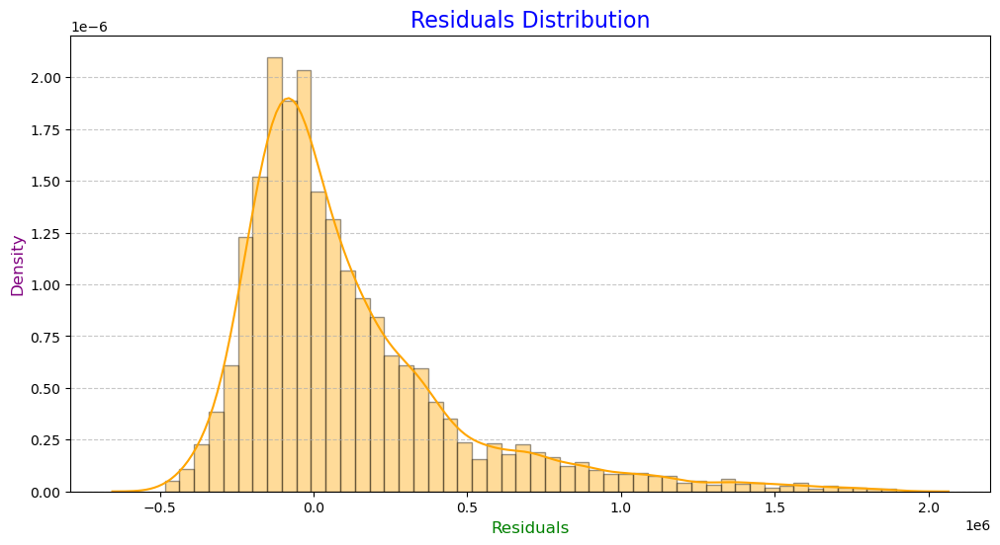

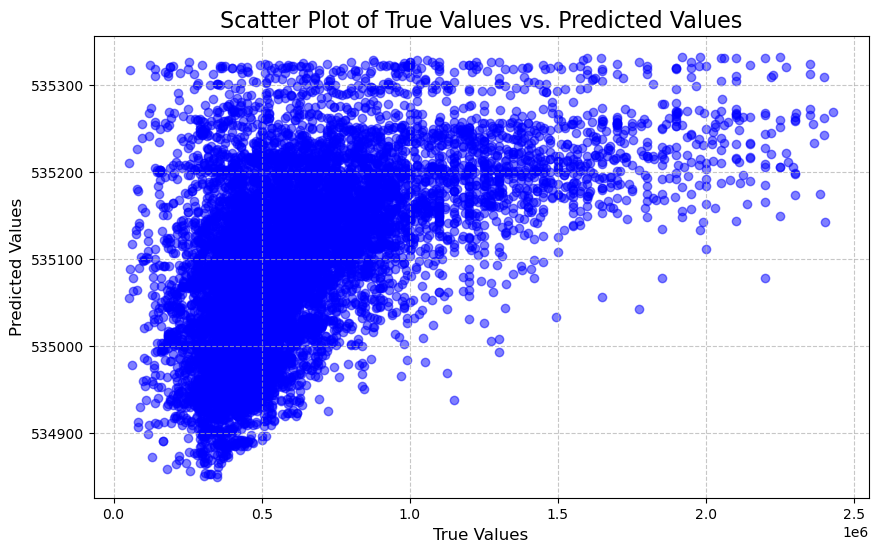

In [24]:
evaluate_model_regression(SVR(), 'SVM', X_train, y_train, X_test, y_test)

Training score : 1.0
Testing score : 0.6817935189307436
R2 score : 0.6817935189307436
MAE : 122601.37615133208
MSE : 41205376425.455185
RMSE : 202991.07474333738


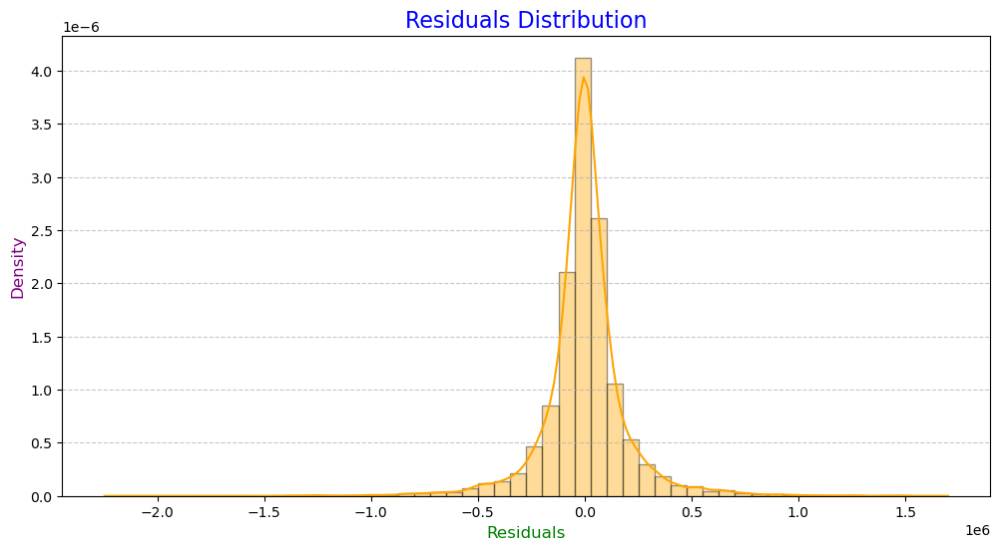

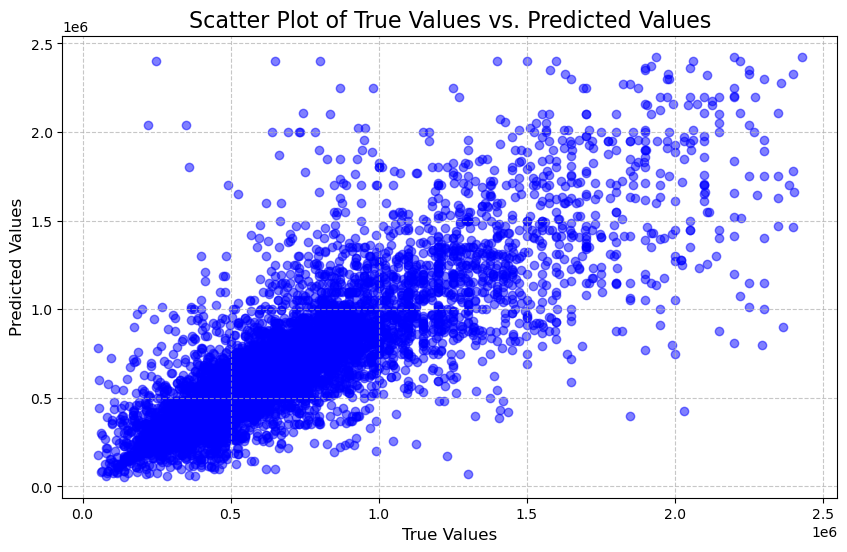

In [25]:
evaluate_model_regression(DecisionTreeRegressor(), 'Decision Tree', X_train, y_train, X_test, y_test)

Training score : 0.920231984011835
Testing score : 0.846068956900363
R2 score : 0.846068956900363
MAE : 87210.50330495367
MSE : 19932927051.54872
RMSE : 141184.01839991918


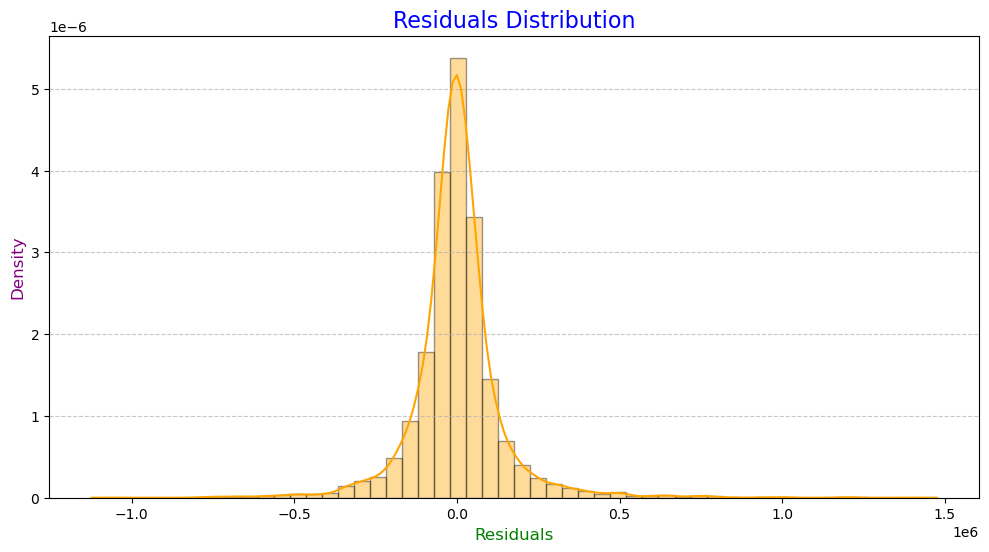

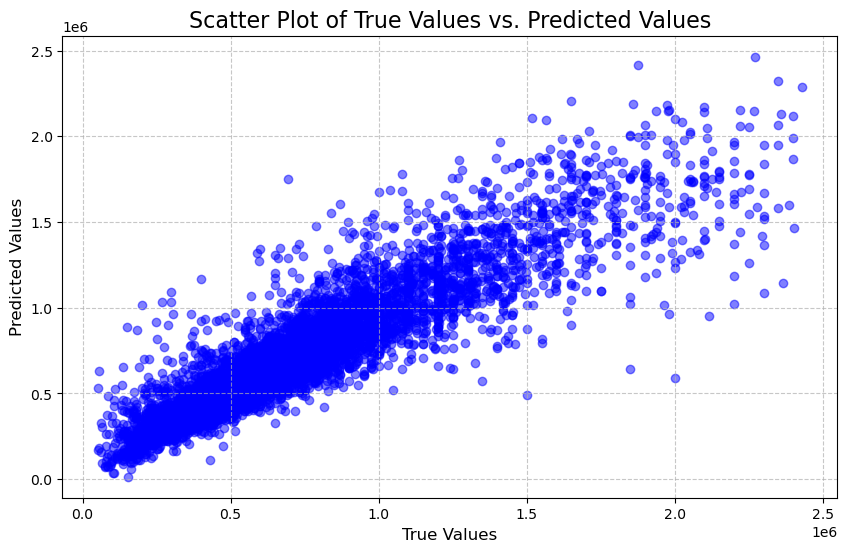

In [26]:
evaluate_model_regression(XGBRegressor(), 'XG Boost', X_train, y_train, X_test, y_test)

In [28]:
%%capture output
evaluate_model_regression(CatBoostRegressor(), 'Cat Boost', X_train, y_train, X_test, y_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020195 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3522
[LightGBM] [Info] Number of data points in the train set: 23559, number of used features: 532
[LightGBM] [Info] Start training from score 634738.593998
Training score : 0.8850830008838828
Testing score : 0.8520956111037813
R2 score : 0.8520956111037813
MAE : 86452.65062243013
MSE : 19152520083.70996
RMSE : 138392.630164001


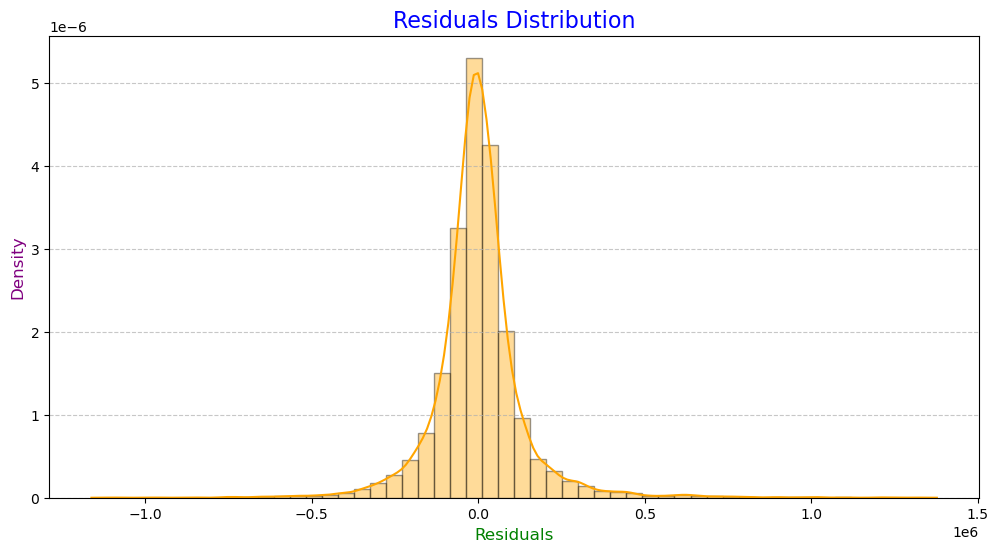

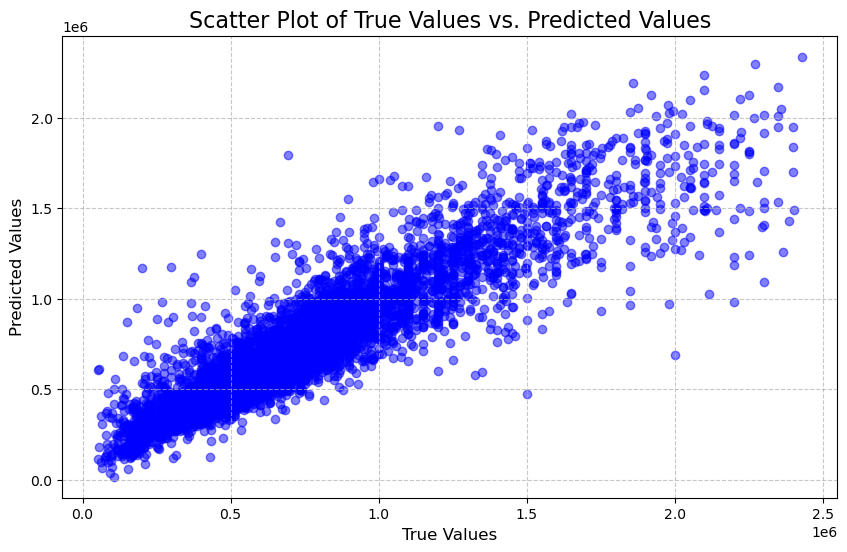

In [29]:
evaluate_model_regression(LGBMRegressor(), 'LGBM', X_train, y_train, X_test, y_test)

Segun los resultados obtenidos en la evaluación de los modelos de Machine Learning, se puede inferir que los valores que presenta la regresión lineal estan asociados a la evaluación de 4 puntos en especial que superan valores de 8e17. Dada las razones por las que este modelo en especial tiene resultados atipicos, para poder comparar todos los demas modelos se reemplazara el "**Testing Score**"" por un valor de -1 para "**Linear Regression**" que sigue significando 

In [30]:
df_results = pd.DataFrame(evaluation_results)
pd.options.display.float_format = "{:,.3f}".format
df_results = df_results.sort_values(by='Testing Score',ascending=False)
df_results = df_results.reset_index(drop=True)
df_results.loc[df_results['Testing Score'] < -1, 'Testing Score'] = -0.1
df_results

,Model,Training Score,Testing Score
0,Cat Boost,0.904,0.864
1,Cat Boost,0.904,0.864
2,LGBM,0.885,0.852
3,XG Boost,0.920,0.846
4,Ridge,0.783,0.777
5,Lasso,0.783,0.777
6,Decision Tree,1.000,0.682
7,SVM,-0.079,-0.089
8,Linear Regression,0.783,-0.100


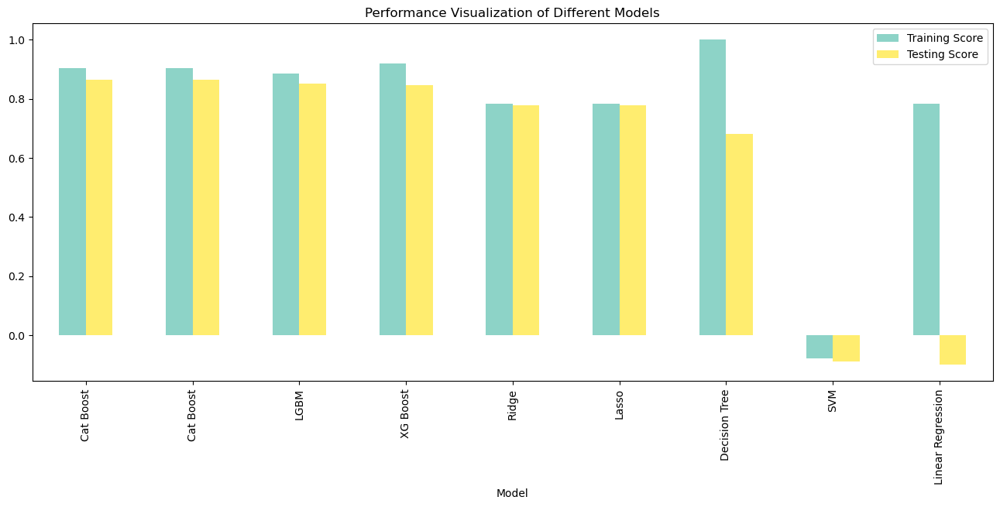

In [31]:
df_results.plot(x="Model",y=["Training Score","Testing Score"], figsize=(16,6),kind="bar",
        title="Performance Visualization of Different Models",colormap="Set3")
plt.show()

Despues de evaluar los modelos de regresión con los que trabajamos, los mejores resultados los obtuvo "**CatBoostRegressor()**". Asi que vamos a buscar los mejores valores de los hiperparametros para obtener mejores resultados y asi concluir nuestro proyecto con una eficiencia esperada conociendo los hiperparametros

In [32]:
%%capture output
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'iterations': [100, 200, 500],
    'depth': [3, 5, 10],}
grid_search = GridSearchCV(CatBoostRegressor(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [33]:
print(f'Best score : {best_score}')
print(f'Best Params for CatBoostRegressor: {best_params}')
best_score,best_params

Best score : 0.8493898727767639
Best Params for CatBoostRegressor: {'depth': 10, 'iterations': 500, 'learning_rate': 0.1}


(0.8493898727767639, {'depth': 10, 'iterations': 500, 'learning_rate': 0.1})

In [36]:
%%capture output
b_model = CatBoostRegressor(**best_params)
b_model.fit(X_train,y_train)
y_predict = b_model.predict(X_test)

In [38]:
metrics.r2_score(y_test, y_predict)

0.8653018201309144